# COTS Detection Project - Faster R-CNN model - Faster Non-local Mean

## Import required modules and libraries

### Install dependencies

In [2]:
# Install dependencies 
!pip install -qq pyyaml==5.1

!pip install -qq torch==1.9.0+cu102 torchvision==0.10.0+cu102 -f https://download.pytorch.org/whl/torch_stable.html

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.9/index.html


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cudf 21.10.1 requires cupy-cuda114, which is not installed.
pytorch-lightning 1.7.7 requires PyYAML>=5.4, but you have pyyaml 5.1 which is incompatible.
pandas-profiling 3.1.0 requires markupsafe~=2.0.1, but you have markupsafe 2.1.1 which is incompatible.
kubernetes 24.2.0 requires pyyaml>=5.4.1, but you have pyyaml 5.1 which is incompatible.
flax 0.6.1 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
dask-cudf 21.10.1 requires dask==2021.09.1, but you have dask 2022.2.0 which is incompatible.
dask-cudf 21.10.1 requires distributed==2021.09.1, but you have distributed 2022.2.0 which is incompatible.
cookiecutter 2.1.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
ERROR: pip's de

Import gdown to facilitate the download of large files from Google Drive

In [ ]:
!conda install -y gdown

### Clear garbage collection

In [ ]:
import gc 
def report_gpu(): 
    gc.collect() 
report_gpu()

### Import modules and libraries

In [3]:
# You may need to restart your runtime prior to this, to let your installation take effect
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import os, json, cv2, random
import matplotlib.pyplot as plt
%matplotlib inline

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

## Main

### import train.csv

In [4]:
raw_train_csv = pd.read_csv("../input/tensorflow-great-barrier-reef/train.csv")

### extract the columns that will be used

In [5]:
df_video = raw_train_csv[['video_id','video_frame','annotations']]
df_video

,video_id,video_frame,annotations
0,0,0,[]
1,0,1,[]
2,0,2,[]
3,0,3,[]
4,0,4,[]
...,...,...,...
23496,2,10755,[]
23497,2,10756,[]
23498,2,10757,[]
23499,2,10758,[]


### Images pre-processing

#### Create folders to store the pre-processed images

In [ ]:
!mkdir -p './data/out'
!mkdir -p './data/out/video_0'
!mkdir -p './data/out/video_1'
!mkdir -p './data/out/video_2'

#### Function for pre-processing

In [6]:
def image_preprocessing(image, blur = False, Gaussian = True, sharp = True):
    kernel = np.array([[0, -1, 0],
                       [-1, 5,-1],
                       [0, -1, 0]])
    res = image
    if blur:
        if Gaussian:
            res = cv2.GaussianBlur(res,(3,3),cv2.BORDER_DEFAULT)
        else:
            res = cv2.fastNlMeansDenoisingColored(res,None,3,3,3,9)
    if sharp:
        res = cv2.filter2D(src=res, ddepth=-1, kernel=kernel)
    return res
    

#### Pre-processsing the images in video 0, 1, 2 and store in ./data/out/ under video_0, video_1 and video_2 folders respectively

In [ ]:
directory_list = ['0','1','2']
import os
from tqdm import tqdm
for dirname, _, filenames in tqdm(os.walk('../input/tensorflow-great-barrier-reef/train_images/')):
    if dirname[-1] in directory_list:
        print(len(filenames))
        for filename in filenames:
            raw_image = cv2.imread(os.path.join(dirname, filename))
            sharpened_image = image_preprocessing(raw_image, blur = True, Gaussian = False, sharp = False)
            cv2.imwrite('./data/out/video_'+ dirname[-1] + '/'+ filename,sharpened_image)
        print("Done processing",dirname)

#### Function for generating the COTS datase

In [7]:
from detectron2.structures import BoxMode
from tqdm import tqdm
def generate_cots_dataset(train_df):
    dataset_dict = []
    
    for index, row in tqdm(train_df.iterrows()):
        image_dict = {}
        tmp = row['annotations'].replace("{","")
        tmp = tmp.replace("}","")
        tmp = tmp.replace("[","")
        tmp = tmp.replace("]","")
        tmp = tmp.split()
        row['annotations'] = tmp
        #print(row)
        file_name = './data/out/video_'+str(row['video_id'])+'/'+str(row['video_frame'])+'.jpg'
        
        
        if len(tmp) == 0:
            pass
        else:
            #print(str(row['video_id'])+'-'+str(row['video_frame']))
            image_dict['image_id'] = str(row['video_id'])+'-'+str(row['video_frame'])
            image_dict['file_name'] = file_name
            im = cv2.imread(file_name)
            image_dict['height'], image_dict['width'], _ = im.shape
            image_dict['annotations'] = []
            tmp_annot = {}
            tmp_annot["bbox"] = [0,0,0,0]
            tmp_annot["bbox_mode"] = BoxMode.XYWH_ABS
            tmp_annot["category_id"] = 0
            for k, i in enumerate(tmp):
                if i == "'x':":
                    tmp_annot["bbox"][0]= int(tmp[k+1].replace(',',''))
                elif i == "'y':":
                    tmp_annot["bbox"][1]= int(tmp[k+1].replace(',',''))
                elif i == "'width':":
                    tmp_annot["bbox"][2]= int(tmp[k+1].replace(',',''))
                elif i == "'height':":
                    tmp_annot["bbox"][3]= int(tmp[k+1].replace(',',''))
                    image_dict['annotations'].append(tmp_annot)
                    tmp_annot = {}
                    tmp_annot["bbox"] = [0,0,0,0]
                    tmp_annot["bbox_mode"] = BoxMode.XYWH_ABS
                    tmp_annot["category_id"] = 0
            dataset_dict.append(image_dict)
    return dataset_dict

generate the dataset from the df_video, only the image with groundtruth will be included in the dataset

In [8]:
cots_dataset = generate_cots_dataset(df_video)

23501it [01:22, 284.57it/s] 


In [9]:
len(cots_dataset)

4919

### Dataset splitting

#### Method 1: split the three datasets

In [ ]:
from sklearn.model_selection import train_test_split
cots_dataset_train, cots_dataset_test = train_test_split(cots_dataset, train_size=0.60)
cots_dataset_val, cots_dataset_test = train_test_split(cots_dataset_test, train_size=0.50)

#### Method 2: import the pre-splited datasets

For Data consistance, the splited datasets have been saved on Google Drive in .json format.

In [ ]:
!gdown https://drive.google.com/uc?id=1F3uihzPv3Yhabt_XQR7FRgsZOK_MEh02

In [ ]:
!gdown https://drive.google.com/uc?id=1PSViyd099hJrwkwflZmDJkbCxle9spRY

In [ ]:
!gdown https://drive.google.com/uc?id=1C64MjKtlbo-0ljARB22_Hv0WAzXH1LVC

In [10]:
import json
with open("./cots_dataset_train_json.json", "r") as read_file:
    cots_dataset_train = json.load(read_file)
with open("./cots_dataset_val_json.json", "r") as read_file:
    cots_dataset_val = json.load(read_file)
with open("./cots_dataset_test_json.json", "r") as read_file:
    cots_dataset_test = json.load(read_file)

In [11]:
print(len(cots_dataset_train))
print(len(cots_dataset_val))
print(len(cots_dataset_test))

2951
984
984


### Dataset registration

In [12]:
cots_dataset_train_val_test = {'train': cots_dataset_train,'val': cots_dataset_val,'test': cots_dataset_test}

In [13]:
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "val", "test"]:
    DatasetCatalog.register("cotsdetect_" + d, lambda d=d: cots_dataset_train_val_test[d])
    MetadataCatalog.get("cotsdetect_" + d).set(thing_classes=["COTS"])
cots_metadata = MetadataCatalog.get("cotsdetect_train")

Examples ground truth images in the dataset

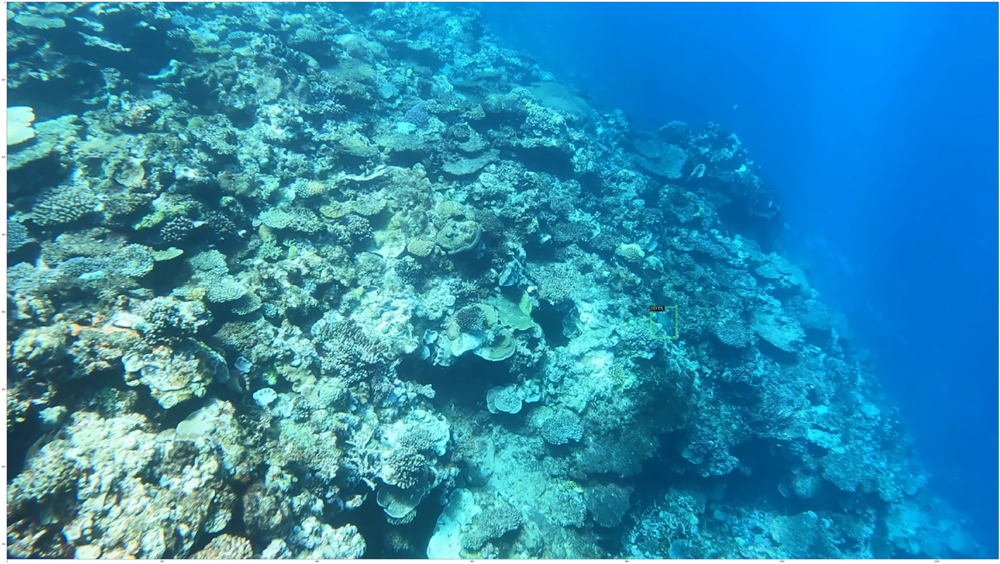

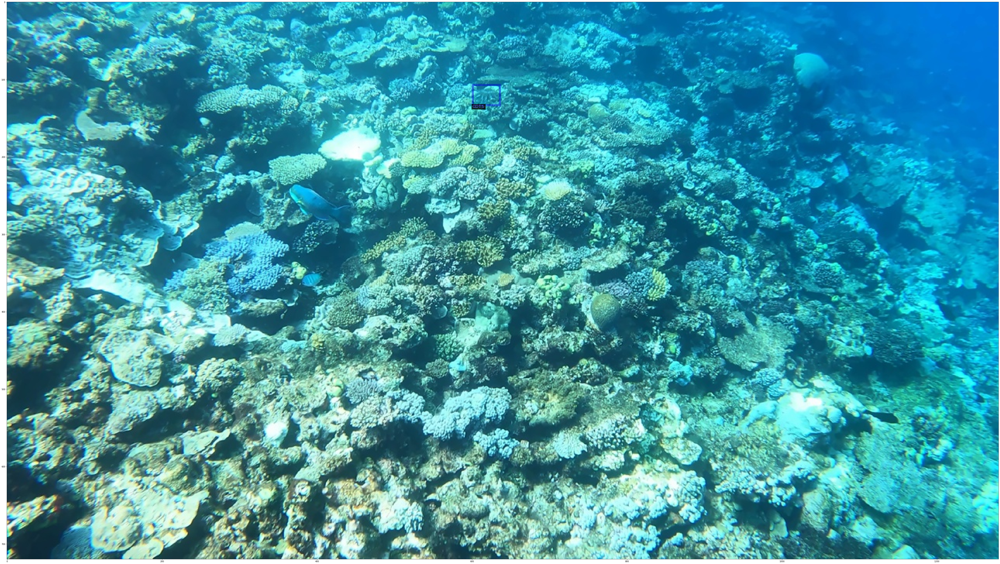

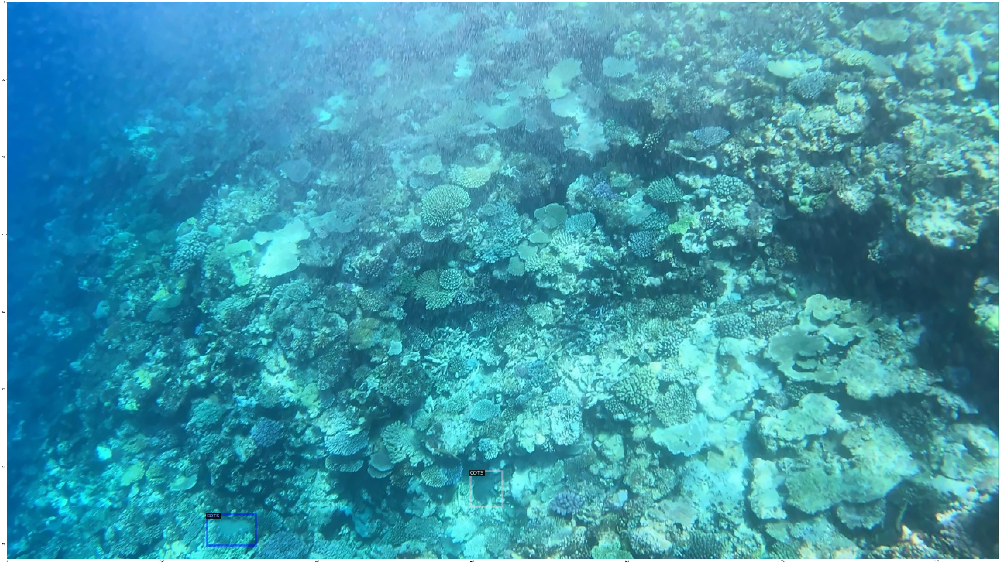

In [14]:

for d in random.sample(cots_dataset, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=cots_metadata)
    vis = visualizer.draw_dataset_dict(d)
    #cv2_imshow(vis.get_image()[:, :, ::-1])
    plt.figure(figsize=(100,50))
    plt.imshow(vis.get_image()) #bgr to rgb

### Model creation

The model is built from from a pre-trained model "COCO-Detection/faster_rcnn_R_50_FPN_1x.yaml". \
The base learning rate is set to 0.0125, with maximum iteration of 500.

In [14]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from distutils import version
import os
model_name = "faster_rcnn_R_50_FPN_1x"
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(f"COCO-Detection/{model_name}.yaml"))
cfg.DATASETS.TRAIN = ("cotsdetect_train",)
cfg.DATASETS.TEST = ("cotsdetect_val",)
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(f"COCO-Detection/{model_name}.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.0125  # pick a good LR
cfg.SOLVER.MAX_ITER = 500   
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1 
cfg.TEST.EVAL_PERIOD = 500
cfg.OUTPUT_DIR = f"./output/starfish_{model_name}"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


### Training process

In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

### Testing and Performance evaluation

#### Create predictor

Since the training process takes time, the trained model has been store on Google Drive.

Before importing the trained model, please create the directory to store the trained model

In [ ]:
!mkdir -p './output/out'
!mkdir -p './output/out/starfish_faster_rcnn_R_50_FPN_1x'

The trained model can be downloaded using below link.

In [ ]:
!gdown https://drive.google.com/uc?id=1-W2e_IYkLdMqRCeA1RlZD1HFbeZ4sSrr

After that move the trained model to the target directory.

In [ ]:
import shutil
shutil.move('./model_final.pth', './output/out/starfish_faster_rcnn_R_50_FPN_1x/model_final.pth'

Create the predictor from the trained model.

In [15]:
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
import os
Predcfg = get_cfg()
model_name = "faster_rcnn_R_50_FPN_1x"
Predcfg.OUTPUT_DIR = f"./output/starfish_{model_name}"
Predcfg.merge_from_file(model_zoo.get_config_file(f"COCO-Detection/{model_name}.yaml"))
Predcfg.MODEL.WEIGHTS = os.path.join(Predcfg.OUTPUT_DIR, "model_final.pth")
Predcfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3  # set the testing threshold for this model
Predcfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
Predcfg.DATASETS.TEST = ("cotsdetect_test", )
predictor = DefaultPredictor(Predcfg)

Randomly sampled 3 files from the testing dataset.

predicted instances:
<class 'detectron2.structures.instances.Instances'>
{'pred_boxes': Boxes(tensor([[  0.0000, 531.8895,  33.6047, 598.9691],
        [640.7257,  89.3827, 680.2328, 125.2233]], device='cuda:0')), 'scores': tensor([0.6070, 0.4490], device='cuda:0'), 'pred_classes': tensor([0, 0], device='cuda:0')}
true instances:
Num_instances: 1
[{'bbox': [1, 532, 38, 40], 'bbox_mode': 1, 'category_id': 0}]
predicted instances:
<class 'detectron2.structures.instances.Instances'>
{'pred_boxes': Boxes(tensor([[487.6186,  79.5434, 519.3403, 103.5985],
        [190.6761, 330.4058, 226.0657, 367.5865],
        [216.9874, 613.9888, 256.6000, 658.3970],
        [693.4592,  30.6772, 726.4189,  65.7914],
        [703.8599,   7.6852, 739.0638,  43.4903]], device='cuda:0')), 'scores': tensor([0.6238, 0.4328, 0.3650, 0.3365, 0.3097], device='cuda:0'), 'pred_classes': tensor([0, 0, 0, 0, 0], device='cuda:0')}
true instances:
Num_instances: 1
[{'bbox': [484, 75, 34, 25], 'bbox_mode': 1, 'category_i

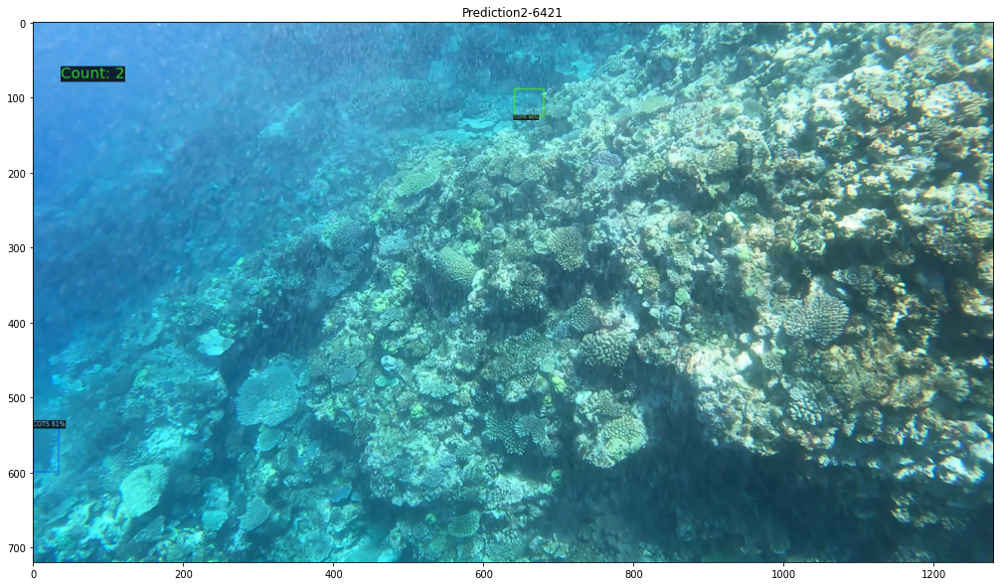

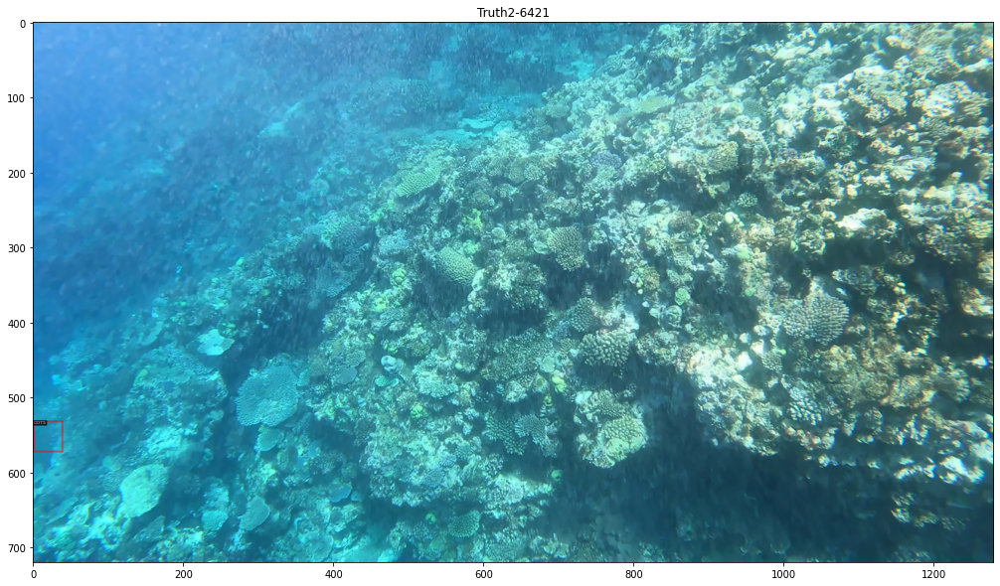

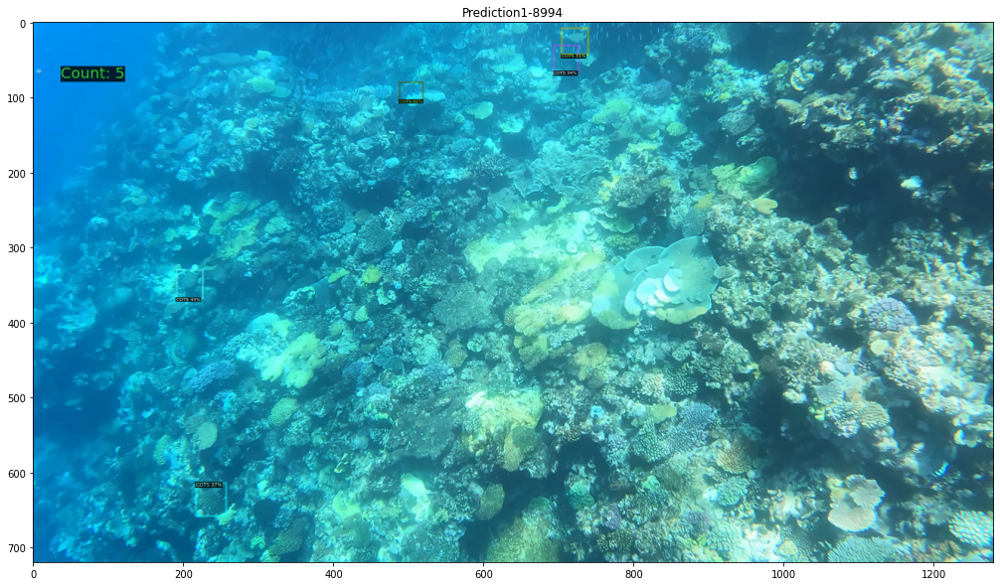

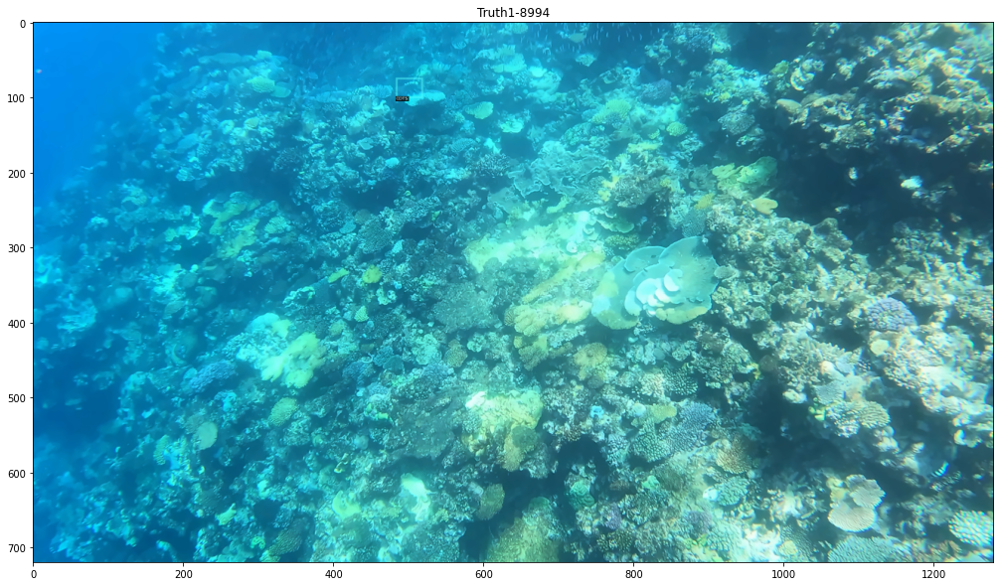

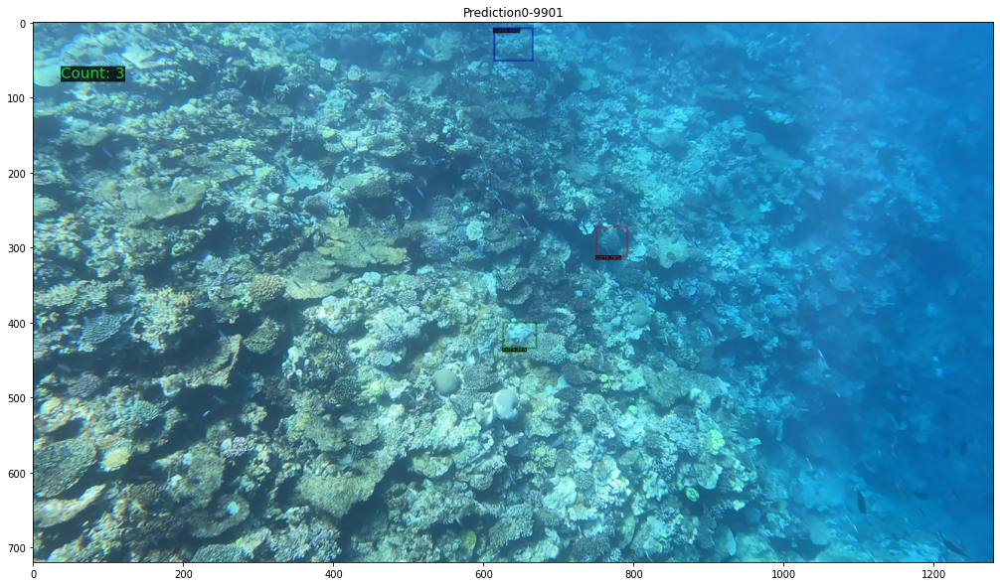

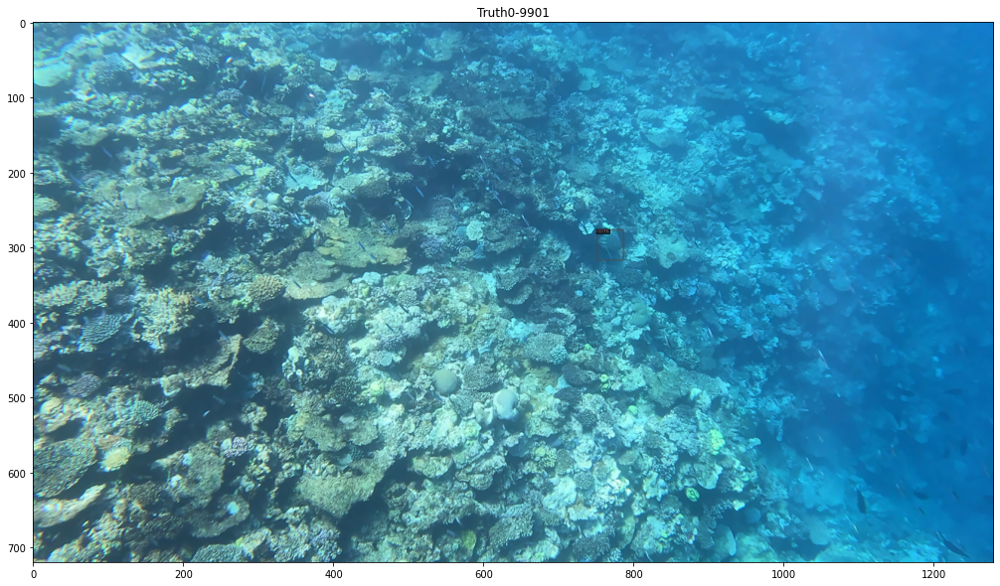

In [29]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(cots_dataset_test, 3):    
    raw_file_path = '../input/tensorflow-great-barrier-reef/train_images/video_' + d["image_id"][:d["image_id"].find('-')]+'/'+d["image_id"][d["image_id"].find('-')+1:]+'.jpg'
    im = cv2.imread(raw_file_path)
    im = image_preprocessing(im, blur = True, Gaussian = False, sharp = False)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=cots_metadata, 
                   scale=1,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    print("predicted instances:")
    print(type(outputs["instances"]))
    print(outputs['instances'].get_fields())
    predicted_boxes = outputs['instances'][outputs['instances'].pred_classes==0].pred_boxes.tensor.cpu().tolist()
    
    # draw the image with predicted boxes
    v.draw_text(f'Count: {len(predicted_boxes)}',(80,60),font_size=20)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    #cv2_imshow(v.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.title("Prediction"+str(d['image_id']))
    plt.imshow(v.get_image()) #bgr to rgb
    
    truth_visualizer = Visualizer(im[:, :, ::-1], metadata=cots_metadata)
    v_truth = truth_visualizer.draw_dataset_dict(d)
    print("true instances:")
    print("Num_instances:",len(d['annotations']))
    print(d['annotations'])
    #cv2_imshow(vis.get_image()[:, :, ::-1])
    plt.figure(figsize=(20,10))
    plt.title("Truth"+str(d['image_id']))
    plt.imshow(v_truth.get_image()) #bgr to rgb

#### Functions for IOU calcuations

Main iou calculation function

In [19]:
def iou_calculate(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)
    # return the intersection over union value
    return iou

Converting box information in the train.csv to bbox format

In [20]:
def convert_to_bbox(box):
    return [box[0],box[1],box[0]+box[2], box[1]+box[3]]

#### Testing process and IOU calculation per image

The raw images in the testing dataset will be passed to the image_preprocessing function. \
The predictions will be made from the preprocessed images. \
At the same time, we cross check with the ground truth information extracted from the train.csv and calculate the iou and other information for F2 score calculation.

In [22]:
from detectron2.utils.visualizer import ColorMode
all_image_dict = dict()
for d in cots_dataset_test:
    raw_file_path = '../input/tensorflow-great-barrier-reef/train_images/video_' + d["image_id"][:d["image_id"].find('-')]+'/'+d["image_id"][d["image_id"].find('-')+1:]+'.jpg'
    im = cv2.imread(raw_file_path)
    im = image_preprocessing(im, blur = True, Gaussian = False, sharp = False)
    outputs = predictor(im)
    
    # extract the predicted boxes and their corresponding confidence scores
    predicted_boxes = outputs['instances'][outputs['instances'].pred_classes==0].pred_boxes.tensor.cpu().tolist()
    scores = outputs['instances'][outputs['instances'].pred_classes==0].scores.cpu().tolist()
    
    truth_boxes = []
    for a in d['annotations']:
        truth_boxes.append(convert_to_bbox(a['bbox']))
    
    # initialize the truth_boxes_picked and predicted_boxes_iou
    truth_boxes_picked = [0 for tb in truth_boxes]
    predicted_boxes_iou = [0 for pb in predicted_boxes]
    
    # initialize a dictionary to store the iou scores of all predicted boxes of all testing images
    image_iou_dict = dict()
    image_iou_dict['predicted_boxes'] = predicted_boxes
    image_iou_dict['truth_boxes'] = truth_boxes
    # looping through the predicted boxes (i.e. the boxes are in descending order of confidence score)
    for key_p, pb in enumerate(predicted_boxes):
        truth_pick = None
        tmp_iou = [0 for tb in truth_boxes]
        # for each predicted box, calculate the iou between it and all truth boxes
        for key, tb in enumerate(truth_boxes):
            # ignore the truth boxes piced by other predicted boxes
            if truth_boxes_picked[key] == 1:
                continue
            # store the iou score in a tmp list
            tmp_iou[key] = iou_calculate(pb, tb)
        # find the max iou for the predicted box
        max_iou = max(tmp_iou)
        # store the max iou for the predicted box
        predicted_boxes_iou[key_p] = float(max_iou)
        # update the picked list for the truth box with the largest iou
        truth_pick = tmp_iou.index(max_iou)
        if float(max_iou) == 0.0:
            pass
        else:
            truth_boxes_picked[truth_pick] = 1
    # store the picked truth boxes and iou information in the image
    image_iou_dict['truth_boxes_picked'] = truth_boxes_picked
    image_iou_dict['predicted_boxes_iou'] = predicted_boxes_iou
    # update the all_image_dict
    all_image_dict[d['image_id']] = image_iou_dict

#### F2 calculation

##### Calculation using the approach mentioned in the original paper

In [23]:
iou_dict = dict()
iou_eval_list = [round(i,2) for i in np.arange(0.3, 0.81, 0.05).tolist()]
# looping through iou threstholds from 0.3 to 0.8 with step of 0.05
for IOU in iou_eval_list:
    tmp_iou_list = []
    # looping through all testing images
    for key, value in all_image_dict.items():
        TP, FP, FN = 0, 0, 0
        # if the iou is larger than or equal to the thresthold IOU, TP+1
        # else FP+1
        for p in value['predicted_boxes_iou']:
            if p >= IOU:
                TP+=1
            else:
                FP+=1
        # for all unpicked groundtruth boxes, FN+1
        FN = value['truth_boxes_picked'].count(0)
        # calculate the 
        image_f2 = (1+4)* TP / ((1+4)* TP + 4*FN + FP)
        tmp_iou_list.append(image_f2)
    # store the F2 value of every image for each of the IOU thresthold in a dictionary
    iou_dict[IOU] = tmp_iou_list
            

In [24]:
print('Denoising using cv2.fastNlMeansDenoisingColored()')
average_iou = []
for key, value in iou_dict.items():
    average_iou.append(sum(value) / len(value))
    print('IOU=', key, 'avg_F2:', sum(value) / len(value))
print('IOU', 'avg_F2:', sum(average_iou) / len(average_iou))

Denoising using cv2.fastNlMeansDenoisingColored()
IOU= 0.3 avg_F2: 0.5745269449532983
IOU= 0.35 avg_F2: 0.5729622753337607
IOU= 0.4 avg_F2: 0.5706706519078716
IOU= 0.45 avg_F2: 0.567549780560485
IOU= 0.5 avg_F2: 0.5594383090197019
IOU= 0.55 avg_F2: 0.5383553772130255
IOU= 0.6 avg_F2: 0.5066579931564379
IOU= 0.65 avg_F2: 0.45443682654463907
IOU= 0.7 avg_F2: 0.37683811596024164
IOU= 0.75 avg_F2: 0.270255467931703
IOU= 0.8 avg_F2: 0.1647328215345792
IOU avg_F2: 0.4687658694650676


##### Calculation using the proposed approach for this project

For every IoU threshold, the TP, FN and FP of all testing images will be accumulated. \
The Final F2 score of a IoU threshold will be calculated using the final accumulated TP, FN and FP of all images. \
*** Remarks *** \
The approach mentioned in the original paper calculates the F2 score for all images and takes average of all F2 scores to get the Final F2 score for a IoU threshold.

In [25]:
iou_new_dict = dict()
iou_eval_list = [round(i,2) for i in np.arange(0.3, 0.81, 0.05).tolist()]
for IOU in iou_eval_list:
    F2, TP, FP, FN, GTN= 0, 0, 0, 0, 0
    for key, value in all_image_dict.items():
        for p in value['predicted_boxes_iou']:
            if p >= IOU:
                TP+=1
            else:
                FP+=1
        FN += value['truth_boxes_picked'].count(0)
        GTN+= len(value['truth_boxes_picked'])
    F2 = (1+4)* TP / ((1+4)* TP + 4*FN + FP)
    print("IOU:", IOU)
    print("TP:", TP,"FN:", FN,"FP:", FP)
    print("Total number of predictions:", TP+FP)
    print("Total number of groundTruth:", GTN)
    iou_new_dict[IOU] = F2

IOU: 0.3
TP: 1611 FN: 754 FP: 1112
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.35
TP: 1604 FN: 754 FP: 1119
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.4
TP: 1594 FN: 754 FP: 1129
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.45
TP: 1576 FN: 754 FP: 1147
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.5
TP: 1543 FN: 754 FP: 1180
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.55
TP: 1488 FN: 754 FP: 1235
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.6
TP: 1377 FN: 754 FP: 1346
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.65
TP: 1198 FN: 754 FP: 1525
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.7
TP: 932 FN: 754 FP: 1791
Total number of predictions: 2723
Total number of groundTruth: 2397
IOU: 0.75
TP: 631 FN: 754 FP: 2092
Total number of predictions: 2723
T

In [26]:
average_new_iou = []
for key, value in iou_new_dict.items():
    average_new_iou.append(value)
    print('IOU=', key, 'F2:', value)
print('IOU', 'avg_F2:', sum(average_new_iou) / len(average_new_iou))

IOU= 0.3 F2: 0.6611672001969958
IOU= 0.35 F2: 0.6598107774578362
IOU= 0.4 F2: 0.6578621543541064
IOU= 0.45 F2: 0.6543220127875115
IOU= 0.5 F2: 0.6477205944085299
IOU= 0.55 F2: 0.6363869643315371
IOU= 0.6 F2: 0.6121632435316084
IOU= 0.65 F2: 0.5687968853860033
IOU= 0.7 F2: 0.4922361888665892
IOU= 0.75 F2: 0.3818225825971197
IOU= 0.8 F2: 0.2479396563765889
IOU avg_F2: 0.5654752963904024


## Simulation of real time application using our model

300 frames in sequence in video 2 are selected for demonstration purpose

In [27]:
df_video_2 = raw_train_csv.loc[raw_train_csv['video_id'] == 2,['video_id','video_frame','annotations']]

In [28]:
import os
demo_images = dict()
for dirname, _, filenames in os.walk('../input/tensorflow-great-barrier-reef/train_images/video_2'):
    for f in filenames:
        if int(f[:f.find('.jpg')])>=4700 and int(f[:f.find('.jpg')])<5000:
            demo_images[int(f[:f.find('.jpg')])] = []
            demo_images[int(f[:f.find('.jpg')])].append('./data/out/video_2' + '/' + f)
            demo_images[int(f[:f.find('.jpg')])].append(dirname + '/' + f)

All 300 frames will be passed to the image_preprocessing function in sequence. \
A video will be created using the preprocessed images. 

In [36]:
from detectron2.utils.visualizer import ColorMode
import subprocess
fps = 15
width = 1280
height = 720
save_path = f'video2.mp4'
tmp_path = "tmp_" + save_path
if os.path.exists(tmp_path):
        os.remove(tmp_path)

output_video = cv2.VideoWriter(tmp_path, cv2.VideoWriter_fourcc(*"MP4V"), fps, (width, height))

for img_id in sorted(demo_images.keys()): 
    im = cv2.imread(demo_images[img_id][1])
    im = image_preprocessing(im, blur = True, Gaussian = False, sharp = False)
    outputs = predictor(im)
    im_raw = cv2.imread(demo_images[img_id][1])
    v = Visualizer(im_raw[:, :, ::-1],
                   metadata=cots_metadata, 
                   scale=1,
                   instance_mode=ColorMode.IMAGE   # remove the colors of unsegmented pixels
    )
    predicted_boxes = outputs['instances'][outputs['instances'].pred_classes==0].pred_boxes.tensor.cpu().tolist()
    
    # draw the image with predicted boxes
    v.draw_text(f'Count: {len(predicted_boxes)}',(80,60),font_size=20)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    output_video.write(v.get_image()[:, :, ::-1])
output_video.release()
if os.path.exists(save_path):
        os.remove(save_path)
subprocess.run(
        ["ffmpeg", "-i", tmp_path, "-crf", "18", "-preset", "slow", "-vcodec", "libx264", save_path]
    )
if os.path.exists(tmp_path):
        os.remove(tmp_path)

OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'
ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --e

This is the simultation of a real-time application using this model.

In [2]:
from IPython.display import Video, display
Video('./video2.mp4')